Group Members: Rosamelia Carioni, Elena Perego, Mischa Rauch.
Student IDs:

In [27]:
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from sklearn.model_selection import train_test_split
from pandas.api.types import CategoricalDtype
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_validate
from numpy import sqrt
from tensorflow import keras
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from scipy.stats import reciprocal
from sklearn.ensemble import RandomForestRegressor
import warnings
from sklearn.metrics import r2_score

# 1. Import data

In [28]:
crime_density = pd.read_csv('clean_data/crime.csv')
median_gross_earning = pd.read_csv('clean_data/median_gross_annual_earning.csv')
personal_well_being = pd.read_csv('clean_data/personal_well_being.csv')
population = pd.read_csv('clean_data/population_annual.csv')
waste = pd.read_csv('clean_data/waste.csv')
gas_energy_consumption = pd.read_csv('clean_data/energy_gas_consumption_annual.csv')
electricity_energy_consumption = pd.read_csv('clean_data/energy_electricity_consumption_annual.csv')
number_of_dwellings = pd.read_csv('clean_data/number_of_dwellings.csv')
# Both median and mean were stracted for experimentation purposes, however, for the final model the median will be considered.
median_house_price = pd.read_csv('clean_data/median_house_price.csv')

# 2. Clean and Structure the data

This step was done in the files 'reding_data_x.ipynb' where x={1,2,3}. In these files, the data was read, as extracted from London Data Store, and structured so that all of them had the same structure and features. The dataframes will be merged into one dataframe in step 5, after the outlier removal is done and the correlation with the house price is checked.

In [29]:
merge1 = pd.merge(crime_density,median_gross_earning, on = ['Area','Code','Year'], how = 'outer')
merge2 = pd.merge(merge1, personal_well_being, on = ['Area','Code','Year'], how = 'outer')
merge3 = pd.merge(merge2, population, on = ['Area','Code','Year'], how = 'outer')
merge4 = pd.merge(merge3, waste, on = ['Area','Code','Year'], how = 'outer')
merge5 = pd.merge(merge4, median_house_price, on = ['Area','Code','Year'], how = 'outer')
data = pd.merge(merge5, number_of_dwellings, on = ['Area','Code','Year'], how = 'outer')

# Fix the housing density
data['Housing_density'] = data['Number_of_dwellings'] / data['Population_estimates']
data = data.drop(['Number_of_dwellings'], axis = 1)
data

,Code,Area,Year,Number_of_crimes,Median_annual_earning,Mean_life_satisfaction,Population_estimates,Waste_recycling_rates,Median_house_price,Housing_density
0,E09000002,Barking and Dagenham,2011,1635.0,28201,7.05,187029,30.0000,170000.0,0.380043
1,E09000003,Barnet,2011,2243.0,30237,7.43,357538,33.6000,325000.0,0.389738
2,E09000004,Bexley,2011,982.0,28638,7.42,232774,53.5000,215000.0,0.408280
3,E09000005,Brent,2011,2601.0,26772,7.11,312245,36.8000,300000.0,0.358959
4,E09000006,Bromley,2011,1797.0,28163,7.50,310554,49.9000,275000.0,0.434823
...,...,...,...,...,...,...,...,...,...,...
226,E09000001,City of London,2013,NaN,54202,NaN,7648,38.8000,615000.0,0.727772
227,E09000001,City of London,2014,NaN,54710,NaN,8072,34.4000,769100.0,0.743682
228,E09000001,City of London,2015,NaN,54034,NaN,8760,30.8000,799999.5,0.711073
229,E09000001,City of London,2016,NaN,55487,NaN,9401,28.5000,831400.0,0.670780


In [54]:
corr = data.corr()
corr

/var/folders/bz/rfsj8qqx5zsg0g1p0xdb1fkw0000gn/T/ipykernel_94970/3655180996.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


,Year,Number_of_crimes,Median_annual_earning,Mean_life_satisfaction,Population_estimates,Waste_recycling_rates,Median_house_price,Housing_density
Year,1.000000,-0.027121,0.096324,0.553585,0.092682,-0.050152,0.399308,-0.052241
Number_of_crimes,-0.027121,1.000000,0.499517,-0.257947,0.385204,-0.485251,0.275613,0.268462
Median_annual_earning,0.096324,0.499517,1.000000,-0.026321,-0.449936,-0.284225,0.415401,0.677733
Mean_life_satisfaction,0.553585,-0.257947,-0.026321,1.000000,-0.057358,0.164894,0.317143,-0.010687
Population_estimates,0.092682,0.385204,-0.449936,-0.057358,1.000000,0.011550,-0.392131,-0.697874
Waste_recycling_rates,-0.050152,-0.485251,-0.284225,0.164894,0.011550,1.000000,-0.305115,-0.143548
Median_house_price,0.399308,0.275613,0.415401,0.317143,-0.392131,-0.305115,1.000000,0.615495
Housing_density,-0.052241,0.268462,0.677733,-0.010687,-0.697874,-0.143548,0.615495,1.000000


<AxesSubplot: >

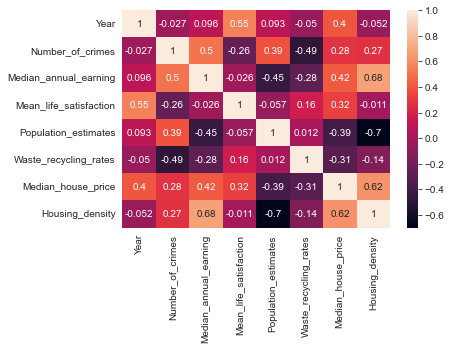

In [55]:
sns.heatmap(corr, annot=True)

# 3. EDA: Outlier Removal


Based on the fact that the data that we are using relates to information about different boroughs throught the year period 2011-2017, it makes no sense to remove outliers, as we do not have multiple samples per borough in the same year to compare the values to. Therefore, we decided to not remove any data points.

## Helper functions for EDA visualization

In [126]:
red = 'YlOrRd'
blue = 'BuPu'
green = 'YlGn'
def create_map(feature_name, color):
    # create a map centered on London
    london_map = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

    # add choropleth layer to the map
    folium.Choropleth(
        geo_data='clean_data/london_boroughs.json',
        name='choropleth',
        data=data,
        columns=['Area', feature_name],
        key_on='feature.properties.name',
        fill_color= color,
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=feature_name
    ).add_to(london_map)
    # add layer control to the map
    folium.LayerControl().add_to(london_map)
    # display the map
    return london_map

# Group data by year and calculate the mean of 'Mean_life_satisfaction'
def time_series_over_year(feature_name):
    mean_satisfaction = data.groupby('Year')[feature_name].mean()
    # Create a line plot of mean life satisfaction by year
    plt.plot(mean_satisfaction.index, mean_satisfaction.values)

    # Add labels and title to the plot
    plt.xlabel('Year')
    plt.ylabel(feature_name)

    # Show the plot
    plt.show()


def standardize_columns(data):
    # (value - mean) / std
    '''
    Input:
      data (data frame): contains only numeric columns
    Output:
      data frame, the same data, except each column is standardized
      to have 0-mean and unit variance
    '''
    mean_per_column = data.mean(axis=0, numeric_only = True) # This is not really needed, you can just do data.mean()
    std_per_column = data.std(axis=0, numeric_only = True)
    return (data - mean_per_column)/std_per_column


def joint_plot_satisfaction(feature_name, data):
    fig, axs = plt.subplots(nrows=2)

    sns.boxplot(
        x= feature_name,
        y='Mean_life_satisfaction',
        data=data.sort_values(feature_name),
        ax=axs[0]
    )

    sns.countplot(
        x= feature_name,
        data=data.sort_values(feature_name),
        ax=axs[1]
    )

    # Draw median price
    axs[0].axhline(
        y=data['Mean_life_satisfaction'].median(),
        color='red',
        linestyle='dotted'
    )

    # Label the bars with counts
    for patch in axs[1].patches:
        x = patch.get_bbox().get_points()[:, 0]
        y = patch.get_bbox().get_points()[1, 1]
        axs[1].annotate(f'{int(y)}', (x.mean(), y), ha='center', va='bottom')

    # Format x-axes
    axs[1].set_xticklabels(axs[1].xaxis.get_majorticklabels(), rotation=90)
    axs[0].xaxis.set_visible(False)

    # Narrow the gap between the plots
    plt.subplots_adjust(hspace=0.01)


def plot_linear_relationship_and_spread(x_name, data, y_name):
    sns.jointplot(
        x=x_name,
        y=y_name,
        data=data,
        #    stat_func=None,
        kind="reg",
        ratio=4,
        space=0,
        scatter_kws={
            's': 3,
            'alpha': 0.25
        },
        line_kws={
            'color': 'black'
        }
    )

# 4. EDA: Visualizations 

## Housing Density (Mischa)

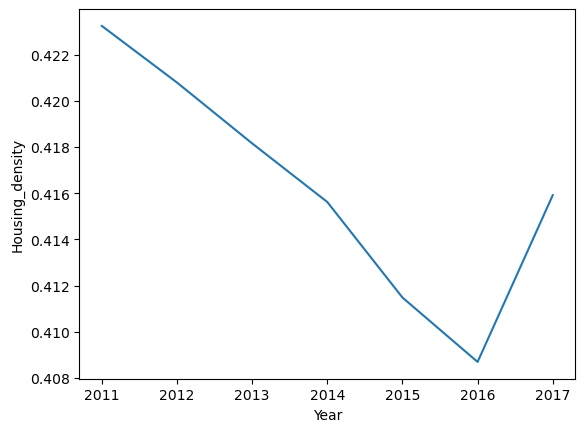

In [52]:
time_series_over_year('Housing_density')

From this joint plot, firstly, it is visible the presence of extremely large values for housing density. Indeed, these values all belong to City of London, which is where most investment banks and offices are which leads to more buildings where people do not live making the housing density ratio higher.

,Code,Area,Year,Number_of_crimes,Median_annual_earning,Mean_life_satisfaction,Population_estimates,Waste_recycling_rates,Median_house_price,Housing_density
224,E09000001,City of London,2011,NaN,54381,NaN,7412,36.9000,465000.0,0.743794
225,E09000001,City of London,2012,NaN,54000,NaN,7604,36.4000,485000.0,0.727380
226,E09000001,City of London,2013,NaN,54202,NaN,7648,38.8000,615000.0,0.727772
227,E09000001,City of London,2014,NaN,54710,NaN,8072,34.4000,769100.0,0.743682
228,E09000001,City of London,2015,NaN,54034,NaN,8760,30.8000,799999.5,0.711073
229,E09000001,City of London,2016,NaN,55487,NaN,9401,28.5000,831400.0,0.670780
230,E09000001,City of London,2017,NaN,56295,NaN,7654,29.2366,835000.0,0.824797


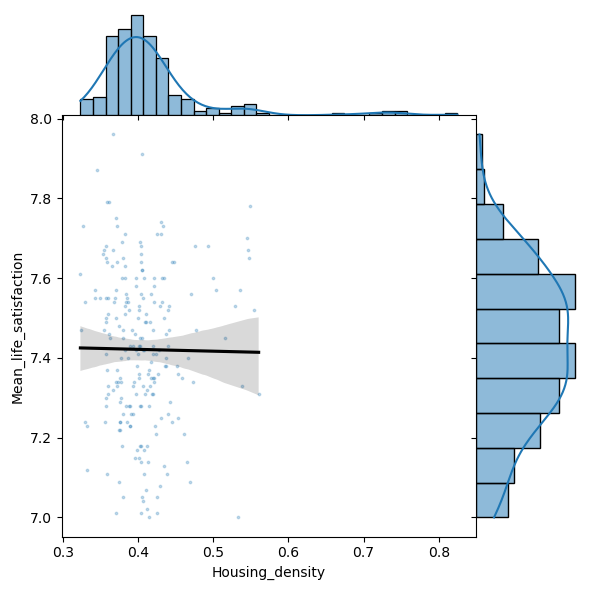

In [53]:
plot_linear_relationship_and_spread('Housing_density',data, 'Mean_life_satisfaction')
data[data['Housing_density']>0.6]

## Population (Mischa)

As expected, population is steadily increasing since people have the resources to live longer.

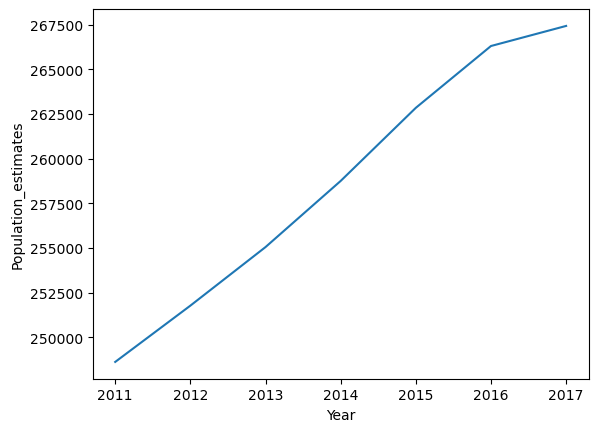

In [54]:
time_series_over_year('Population_estimates')

Now, just like with Housing Density, the distribution of the Population estimates shows some extremely low values compared to the rest of the distribution. After looking into them more in depth, they still all belong to City of London, which further corroborate our hypothesis that less people live in this neighborhood while more offices are present.

,Code,Area,Year,Number_of_crimes,Median_annual_earning,Mean_life_satisfaction,Population_estimates,Waste_recycling_rates,Median_house_price,Housing_density
224,E09000001,City of London,2011,NaN,54381,NaN,7412,36.9000,465000.0,0.743794
225,E09000001,City of London,2012,NaN,54000,NaN,7604,36.4000,485000.0,0.727380
226,E09000001,City of London,2013,NaN,54202,NaN,7648,38.8000,615000.0,0.727772
227,E09000001,City of London,2014,NaN,54710,NaN,8072,34.4000,769100.0,0.743682
228,E09000001,City of London,2015,NaN,54034,NaN,8760,30.8000,799999.5,0.711073
229,E09000001,City of London,2016,NaN,55487,NaN,9401,28.5000,831400.0,0.670780
230,E09000001,City of London,2017,NaN,56295,NaN,7654,29.2366,835000.0,0.824797


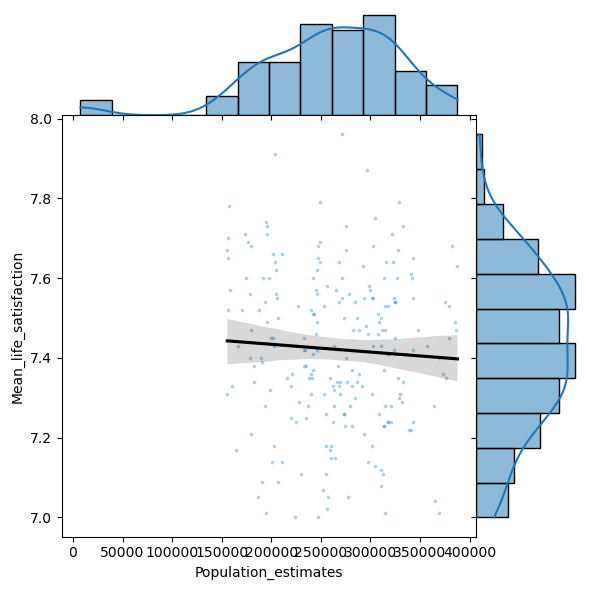

In [55]:
plot_linear_relationship_and_spread('Population_estimates',data,'Mean_life_satisfaction')
data[data['Population_estimates']<50000]

This should show correlations with happiness per feature. Meli: do happiness with year and neighbourhood.

## Personal Well-Being over the Years (Meli)

To see the relationship of the personal well-being through years the following line plot was generated in which the mean of all the boroughs is taken for the year. From the graphs obtained it is interesting to see that the mean life satisfaction considerably increased from 2012 to 2016 from approx. 7.25 to 7.55, and it then slightly decreased to about 7.53 in 2017.
A reason of why the personal well-being increased from 2012 to 2016 might be related to The Summer Olympics which were hosted in London. This event brought significant investment in infrastructure and tourism to the city, which could have had a positive impact on salaries and the economy in general. Additionally, it could be inferred that the introduction of London Living Wage in 2011 improved people's life-style and therefore happiness.
The decrease after 2016 could be related to Brexit, but this is just a hypothesis.

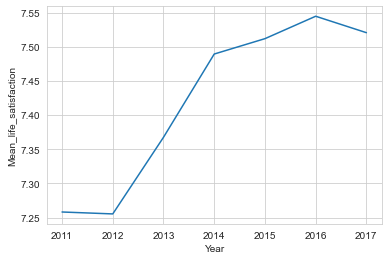

In [61]:
time_series_over_year('Mean_life_satisfaction')


Now, to look more in detail in the change from 2011 to 2017 per area, the following map was generated, in which we can see that the areas that increased their median life satisfaction the most were Brent, Waltham Forest and Barking and Dagenham.

In [103]:
temp = data.loc[(data['Year'] == 2011)  | (data['Year'] ==2017)]
grouped = temp.groupby('Area')

# calculate difference in mean life satisfaction between 2017 and 2011
diff = lambda x: x[x['Year'] == 2017]['Mean_life_satisfaction'].values[0] - x[x['Year'] == 2011]['Mean_life_satisfaction'].values[0]

# create new dataframe with difference values
new_df = pd.DataFrame({'Area': grouped.groups.keys(),
                       'Diff_mean_life_satisfaction_2017_2011': grouped.apply(diff)}).reset_index(drop=True)


london_map = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

# add choropleth layer to the map
folium.Choropleth(
    geo_data='clean_data/london_boroughs.json',
    name='choropleth',
    data=new_df,
    columns=['Area', 'Diff_mean_life_satisfaction_2017_2011'],
    key_on='feature.properties.name',
    fill_color= 'BuPu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Diff_mean_life_satisfaction_2017_2011'
).add_to(london_map)
# add layer control to the map
folium.LayerControl().add_to(london_map)
london_map

## Neighbourhoods and Personal Well-Being (ELE)

This map enables to compare the mean life satisfaction in different neighbourhoods of London. Indeed, it is visible that borough far from the busy center are happier than the closer ones. This is expected since people that live in the city center may be more influence by the chaotic and fast life of London.

In [62]:
map_satisfaction = create_map('Mean_life_satisfaction', red)
map_satisfaction

## Average Income and Personal Well-Being (Meli)


From the map we can see the boroughs of London in which individuals earn more money. This seems to be clustered in the center, but mainly be related to City of Lonon and Tower Hamlets, as expected.

In [63]:
map_satisfaction = create_map('Median_annual_earning', green)
map_satisfaction

From the plot bellow, we can see surprisingly that the correlation from the life satisfaction and annual earning is very low, and negative. This result calls our attention and will be further investigated by filtering the data by years, after doing this we can see that for some years such as 2017, the correlation is negative, whereas for others (2013) is positive, this explains the unnexpected result in the first graph. Now, as why some years present a negative correlation might be explained by the little available data, which makes the linnear regression line not significant.

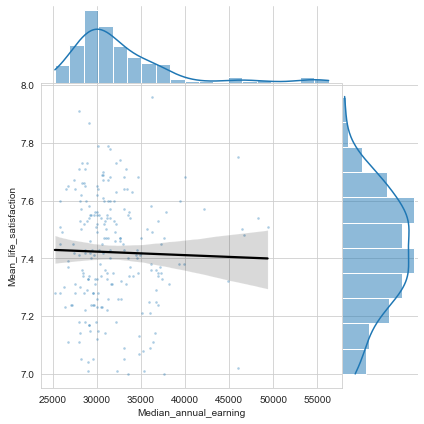

In [111]:
plot_linear_relationship_and_spread('Median_annual_earning', data, 'Mean_life_satisfaction')

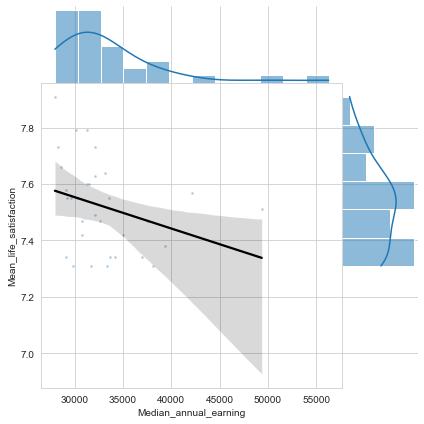

In [110]:
temp = data[data['Year']==2017]
plot_linear_relationship_and_spread('Median_annual_earning', temp, 'Mean_life_satisfaction')

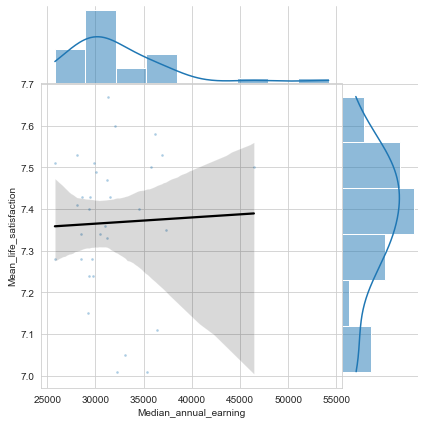

In [115]:
temp = data[data['Year'] == 2013]
plot_linear_relationship_and_spread('Median_annual_earning', temp, 'Mean_life_satisfaction')

Now, from the line plot show bellow, we can see an increase in median annual earning after 2011, related to the	introduction of the London Living Wage. The decrease from 2013 to 1014 cannot be explained with any information found on events that occured in the country, and the linear increase after 2014 could be related to inflation or overall increase in salaries.

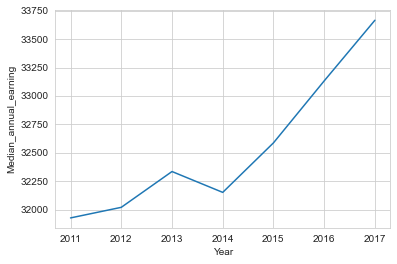

In [124]:
time_series_over_year('Median_annual_earning')

## Average House Price and Personal Well-Being (MELI)



From areas where individuals have a higher annual earning, the price of the median house is higher overall, however, we can see that Kensington and Chelsea now takes the lead and is the borough with highest valued properties.

In [65]:
map = create_map('Median_house_price', red)
map

Moving on to the correlation of the house price and personal well-being, there exists a clear positive correlation, which was first computed back at the beginning of the assignment and now can be verified with the linear regression plot.

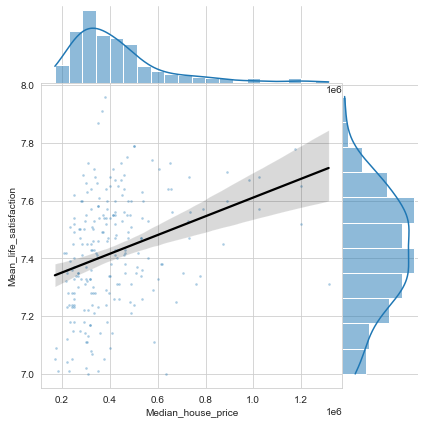

In [123]:
plot_linear_relationship_and_spread('Median_house_price', data, 'Mean_life_satisfaction')

Finally, when we look over the entire period of time (2011-2017) we can see that the median house price has gradually increased as expected.

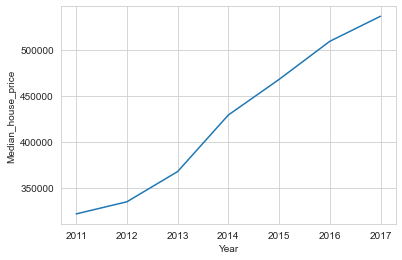

In [125]:
time_series_over_year('Median_house_price')

## Crime rates and Personal Well-Being (ELE)

To investigate the relationship between number of crimes and the personal well-being in London, firstly, a scatter plot and the respective distributions are plotted. Indeed, there is a clear negative linear relationship between the two variables which confirms what was expected, which is the fewer crimes the more well-being.

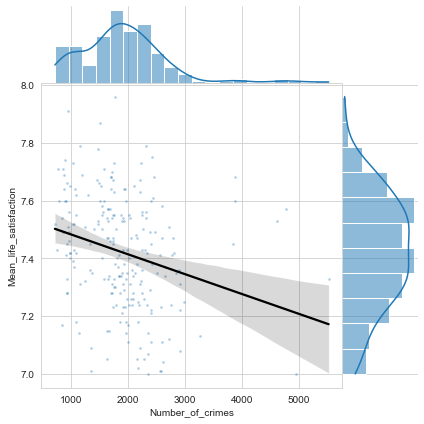

In [67]:
plot_linear_relationship_and_spread('Number_of_crimes', data, 'Mean_life_satisfaction')

Then, to get insights into the development of crimes in London and take into considerations eventual trends, a time series of the number of crimes is shown. It is interesting to see the drastic drop in 2014, although research did not show a clear for such reason

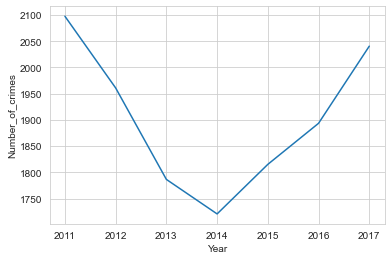

In [68]:
time_series_over_year('Number_of_crimes')

Lastly, the spread of number of crimes throughout the neighborhoods in London is studied through a map. As expected, there is an increase in crimes in the city center since it is a very populated area.

In [69]:
map_crime = create_map('Number_of_crimes', blue)
map_crime

## Household waste recycling rate and Mean Life satisfaction (ELE)

The same process is applied when studying the relationship between waste recycling rates and personal well-being. Firstly, it is noticeable that there is a weaker relationship between these two variables, however, this time, it is positive, meaning that the more people recycle the happier they are.

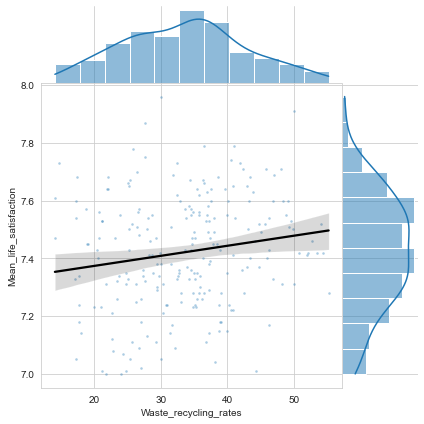

In [70]:
plot_linear_relationship_and_spread('Waste_recycling_rates', data, 'Mean_life_satisfaction')

Secondly, this time series shows a radical changes as well. In particular, 2015 seems to look like a year of change since recycling rates start increasing. Indeed, 2015 is the year by which Boris Johnson wanted a 45% recycling rate for London to bring the capital in line with the national average.

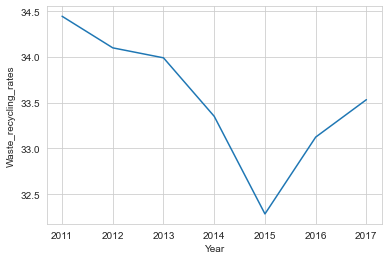

In [71]:
time_series_over_year('Waste_recycling_rates')

The map of London colored with the respective average recycling rates shows that far from the city centre citizens tend to recycle more.

In [72]:
map_waste = create_map('Waste_recycling_rates', green)
map_waste

## Change of features through years (Meli)

By looking into the different features we can gain a better understanding of the data, however, by looking them individually the conclusions that we can obtain tend to be limited. By looking into their change together, trends and more insights are possible to conclude, which is the purpose of the following plot.
We can see, #TODO

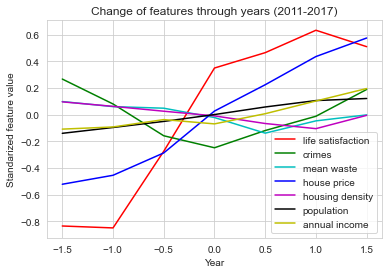

In [89]:
temp = data
temp = standardize_columns(temp)

# Group data by year and calculate the mean of 'Mean_life_satisfaction'
mean_satisfaction = temp.groupby('Year')['Mean_life_satisfaction'].mean()
mean_crimes = temp.groupby('Year')['Number_of_crimes'].mean()
mean_waste = temp.groupby('Year')['Waste_recycling_rates'].mean()
mean_house_price = temp.groupby('Year')['Median_house_price'].mean()
mean_housing_density = temp.groupby('Year')['Housing_density'].mean()
mean_population_density = temp.groupby('Year')['Population_estimates'].mean()
mean_income = temp.groupby('Year')['Median_annual_earning'].mean()

year = range(2011,2017)
# Create a line plot of mean life satisfaction by year
plt.plot(mean_satisfaction.index, mean_satisfaction.values, color = 'r', label = 'life satisfaction')
plt.plot(mean_crimes.index, mean_crimes.values, color = 'g', label = 'crimes')
plt.plot(mean_waste.index, mean_waste.values, color = 'c', label = 'mean waste')
plt.plot(mean_house_price.index, mean_house_price.values, color = 'b', label = 'house price')
plt.plot(mean_housing_density.index, mean_housing_density.values, color = 'm', label = 'housing density')
plt.plot(mean_population_density.index, mean_population_density.values, color = 'k', label = 'population')
plt.plot(mean_income.index, mean_income.values, color = 'y',  label = 'annual income')


# Add labels and title to the plot
plt.xlabel('Year')
plt.ylabel('Standarized feature value')
plt.title('Change of features through years (2011-2017)')
plt.legend()
plt.show()


# TODO: not sure whre we want to answer the RQs?
### Compare all variables with nice plots to house price --> RQ 2  (Meli: hers + crime, Mischa: his + house density, Ele: waste)


### RQ 1 --> "How does location of neighborhoods affect personal well-being in London?"  (ELENA)

# 5. Models for Personal-Wellbeing Prediction

In [74]:
# Ignore DeprecationWarning - we get it normalization = true is deprecated
warnings.filterwarnings("ignore", category=DeprecationWarning)

# 5.0 Create training set

In [30]:
train_set, test_set = train_test_split(data.dropna(), test_size=0.20, random_state=123)
X_train = train_set.drop(['Mean_life_satisfaction','Code','Area'],axis=1)
y_train = train_set['Mean_life_satisfaction']
X_test = test_set.drop(['Mean_life_satisfaction','Code','Area'],axis=1)
y_test = test_set['Mean_life_satisfaction']


scaler = StandardScaler()
# Fit the scaler to the data and transform the data
X_train_prepared = scaler.fit_transform(X_train)
X_test_prepared = scaler.transform(X_test)


print(X_train.shape)
print(X_test.shape)

(179, 7)
(45, 7)


## 5.1 Linear Regression (elena)

As expected, Linear Regression does not show good accuracy (Mean Absolute Error: 0.137) neither well describes the target variable (R2 score: 0.225). However, it still provides interesting insights regarding the relationship between the features and personal well-being. Indeed, median house price, year and population estimates have a positive relationship with happiness, whereas housing density and number of crimes are negatively related. These results corroborate with our previous EDA.

In [32]:
lin_reg = LinearRegression()
lin_reg.fit(X_train_prepared, y_train)
print("Score: ",lin_reg.score(X_train_prepared,y_train))

predict = lin_reg.predict(X_test_prepared)

# Print the coefficients with their feature names
print("Coefficients:")
coef_df = pd.DataFrame({'feature': X_train.columns, 'coefficient': lin_reg.coef_})
coef_df = coef_df.sort_values('coefficient', ascending=False)
print(coef_df)
print('R2 Score ', r2_score(y_test, predict))
print("Mean Square Error: ", mean_squared_error(y_test, predict))
print("Root Mean Squared Error ", sqrt(mean_squared_error(y_test,predict)))
print("Mean Absolute Error ", mean_absolute_error(y_test,predict))
print("Mean Absolute Percentage Error ", mean_absolute_percentage_error(y_test,predict))

Score:  0.4515497074148006
Coefficients:
                 feature  coefficient
5     Median_house_price     0.089966
0                   Year     0.074099
3   Population_estimates     0.021867
4  Waste_recycling_rates     0.021188
2  Median_annual_earning     0.019755
6        Housing_density    -0.027671
1       Number_of_crimes    -0.075741
R2 Score  0.30415883238132824
Mean Square Error:  0.02751249452931159
Root Mean Squared Error  0.16586890766298423
Mean Absolute Error  0.13108282824987755
Mean Absolute Percentage Error  0.017647300895163365


## 5.2 Polynomial Regression (Mischa)

In [33]:
poly_lin_mod = Pipeline([
        ("poly_features", PolynomialFeatures(degree=2)),
        ("linear", LinearRegression())
    ])

start = datetime.now()


poly_lin_mod.fit(X_train_prepared, y_train)
score = cross_validate(poly_lin_mod, X_train_prepared, y_train, cv=3)

predict = poly_lin_mod.predict(X_test_prepared)
end = datetime.now()
print("Score: ",poly_lin_mod.score(X_train_prepared,y_train))
print('R2 Score ', r2_score(y_test, predict))
print("Mean Square Error: ", mean_squared_error(y_test, predict))
print("Root Mean Squared Error ", sqrt(mean_squared_error(y_test,predict)))
print("Mean Absolute Error ", mean_absolute_error(y_test,predict))
print("Mean Absolute Percentage Error ", mean_absolute_percentage_error(y_test,predict))
print("---------------------")
print("Elapsed", (end - start).total_seconds(), "seconds")

Score:  0.6571544652709107
R2 Score  0.3337976461409523
Mean Square Error:  0.026340621206254897
Root Mean Squared Error  0.16229793962418285
Mean Absolute Error  0.1308163341154365
Mean Absolute Percentage Error  0.017533607090253752
---------------------
Elapsed 0.010888 seconds


## 5.3 Random Forest (Meli)

In [34]:
rf_reg = RandomForestRegressor(n_estimators=50, max_features=5)
est = rf_reg.fit(X_train_prepared, y_train)

price_predictions = est.predict(X_test_prepared)
randomforest_rmse = np.sqrt(mean_squared_error(y_test, price_predictions))
print('R2 Score ', r2_score(y_test, price_predictions))
print('mean squared error: ', mean_squared_error(y_test, price_predictions))
print('Root mean squared error: ', randomforest_rmse)
print('mean absolute error: ', mean_absolute_error(y_test, price_predictions))
print('mean absolute percentage error: ', mean_absolute_percentage_error(y_test, price_predictions))

R2 Score  0.5168630119877003
mean squared error:  0.019102496888888865
Root mean squared error:  0.13821178274260434
mean absolute error:  0.11557777777777757
mean absolute percentage error:  0.015541851606509956


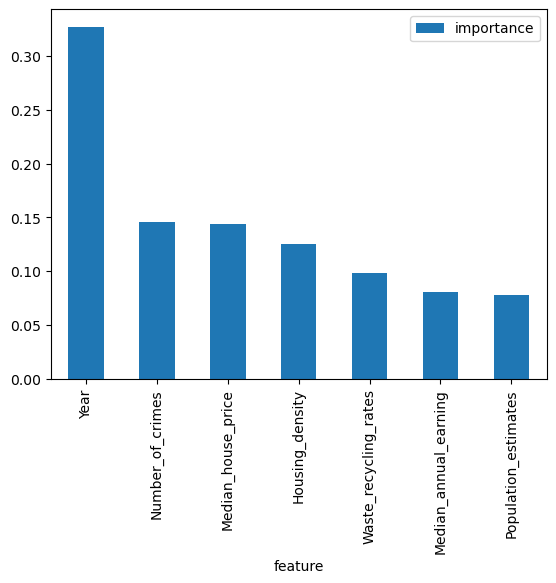

In [35]:
importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(rf_reg.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances.plot.bar()
plt.show()

## 5.4 Neural Network (Mischa)

In [36]:
# create a validation dataset to account for overfitting
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.10, random_state=123)

X_valid_prepared = scaler.transform(X_valid)
X_train_prepared = scaler.transform(X_train)
X_test_prepared = scaler.transform(X_test)

print(X_train_prepared.shape)
print(X_test_prepared.shape)

(161, 7)
(45, 7)


In [37]:
model = keras.models.Sequential()
input_ = keras.layers.Input(shape=X_train_prepared.shape[1:])
hidden1 = keras.layers.Dense(60,activation="relu")(input_)
hidden2 = keras.layers.Dense(60,activation="relu")(hidden1)
hidden3 = keras.layers.Dense(60,activation="relu")(hidden2)
concat = keras.layers.concatenate([input_, hidden2, hidden3])
output = keras.layers.Dense(1)(concat)
model = keras.models.Model(inputs=[input_],outputs=[output])

model.compile(loss="mean_absolute_error", optimizer=keras.optimizers.Adam(learning_rate=1e-2))
history = model.fit(X_train_prepared, y_train, epochs=20, validation_data=(X_valid_prepared, y_valid))

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 4.5901 - val_loss: 5.2236
Epoch 2/20
6/6 [==============================] - 0s 6ms/step - loss: 4.5183 - val_loss: 2.8379
Epoch 3/20
6/6 [==============================] - 0s 6ms/step - loss: 2.5634 - val_loss: 2.8604
Epoch 4/20
6/6 [==============================] - 0s 6ms/step - loss: 1.8331 - val_loss: 1.9323
Epoch 5/20
6/6 [==============================] - 0s 6ms/step - loss: 1.9853 - val_loss: 1.8829
Epoch 6/20
6/6 [==============================] - 0s 6ms/step - loss: 2.1690 - val_loss: 2.1777
Epoch 7/20
6/6 [==============================] - 0s 6ms/step - loss: 1.6941 - val_loss: 1.7695
Epoch 8/20
6/6 [==============================] - 0s 6ms/step - loss: 1.9929 - val_loss: 1.5186
Epoch 9/20
6/6 [==============================] - 0s 8ms/step - loss: 1.3345 - val_loss: 1.6305
Epoch 10/20
6/6 [==============================] - 0s 12ms/step - loss: 1.2500 - val_loss: 1.4464
Epoch 11/20
6/6 [====================

In [39]:
print(model.evaluate(X_test_prepared,y_test))
pred = model.predict(X_test_prepared)
print('R2 Score ', r2_score(y_test, pred))

2/2 [==============================] - 0s 3ms/step - loss: 0.6572
0.6572173237800598
2/2 [==============================] - 0s 2ms/step
R2 Score  -16.02879643853435


In [40]:
def build_model(n_hidden=1, n_neurons=30, learning_rate=1e-2, input_shape=[7]):
    model = keras.models.Sequential()
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    for layer in range(n_hidden):
        model.add(keras.layers.Dense(n_neurons, activation="relu"))
    model.add(keras.layers.Dense(1))
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(loss="mean_absolute_error", optimizer=optimizer)
    return model

keras_reg = keras.wrappers.scikit_learn.KerasRegressor(build_model)

/var/folders/x1/8mvq21453dx722swn08f95280000gn/T/ipykernel_71743/198344352.py:11: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_reg = keras.wrappers.scikit_learn.KerasRegressor(build_model)


In [41]:
param_distribs = {
    "n_hidden": [ 1, 2, 3],
    "n_neurons": np.arange(20, 60).tolist(),
    "learning_rate": reciprocal(1e-2, 3e-2).rvs(1000).tolist(),
}

rnd_search_cv = RandomizedSearchCV(keras_reg, param_distribs, n_iter=10, cv=2, verbose=2)
rnd_search_cv.fit(X_train_prepared, y_train, epochs=20,
                  validation_data=(X_valid_prepared, y_valid),
                  callbacks=[keras.callbacks.EarlyStopping(patience=10)])

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Epoch 1/20
3/3 [==============================] - 1s 66ms/step - loss: 7.1195 - val_loss: 6.2382
Epoch 2/20
3/3 [==============================] - 0s 13ms/step - loss: 5.6585 - val_loss: 4.7676
Epoch 3/20
3/3 [==============================] - 0s 13ms/step - loss: 4.0930 - val_loss: 3.4602
Epoch 4/20
3/3 [==============================] - 0s 13ms/step - loss: 2.5438 - val_loss: 3.1346
Epoch 5/20
3/3 [==============================] - 0s 13ms/step - loss: 2.2562 - val_loss: 2.4795
Epoch 6/20
3/3 [==============================] - 0s 13ms/step - loss: 2.1408 - val_loss: 1.7717
Epoch 7/20
3/3 [==============================] - 0s 13ms/step - loss: 1.8581 - val_loss: 1.3479
Epoch 8/20
3/3 [==============================] - 0s 13ms/step - loss: 1.4427 - val_loss: 1.3764
Epoch 9/20
3/3 [==============================] - 0s 13ms/step - loss: 1.4209 - val_loss: 1.4752
Epoch 10/20
3/3 [==============================] - 0s 14ms/step - 

RandomizedSearchCV(cv=2,
                   estimator=<keras.wrappers.scikit_learn.KerasRegressor object at 0x7fb7c84cf640>,
                   param_distributions={'learning_rate': [0.013219837082534592,
                                                          0.02013936606161293,
                                                          0.028029273998140144,
                                                          0.010326381189777368,
                                                          0.02436792689243982,
                                                          0.028493647225642377,
                                                          0.025620943763369743,
                                                          0.024617087119955045,
                                                          0.019187855942306965,
                                                          0.012023638552243886,
                                                          0.0...
            

In [42]:
print(rnd_search_cv.best_params_)
print(rnd_search_cv.best_score_)

{'n_neurons': 38, 'n_hidden': 3, 'learning_rate': 0.029912176275142546}
-0.4626755118370056


In [43]:
rnd_search_cv.score(X_test_prepared, y_test)

2/2 [==============================] - 0s 3ms/step - loss: 0.2938


-0.29381051659584045

In [44]:
model = rnd_search_cv.best_estimator_.model
model.evaluate(X_test_prepared, y_test)

2/2 [==============================] - 0s 3ms/step - loss: 0.2938


0.29381051659584045

In [45]:
pred = model.predict(X_test_prepared)
print('R2 Score ', r2_score(y_test, pred))

2/2 [==============================] - 0s 2ms/step
R2 Score  -2.3901113551011863


# 6. Ethical Implications (Elena, Meli)

# 7. Conclusion (ALL)

### 1.	How does location of neighborhoods affect personal well-being in London?
Even though the map shows a lot of variance among personal well-being and the neighborhoods, we can see that overall the boroughs with higher personall well-being are located in the outer areas of London: Sutton, Horrow, Brent and Waltham Forest. This trend is not entirely unexpected, given that people residing in the city center may be more exposed to the fast-paced and often stressful lifestyle that characterizes London's urban core. However, not all boroughs in the outer area have higher scores on personal well-being when compared to more central areas. It is also worth noting that data for City of London was not available.

If we consider that the areas with highest scores are located in the outer areas, one could infere that the results could be indicative of various factors that impact quality of life in London, such as year, number of crimes per borough, median house price per borough and housing density, which were shown to be the most influential features in the Random Forest model. Other factors that could impact the life satisfaction level and might be the reason to not all outer areas showing highes resuts, could be could be availability of green spaces, community cohesion, and access to social amenities. An example of the relevance of the availability of green areas is that neighborhoods located further away from the city center may benefit from a greater abundance of parks and green spaces, which have been shown to promote feelings of well-being and happiness. Additionally, the lower population density and slower pace of life in these areas may create a stronger sense of community and social support among residents, which could also contribute to higher levels of life satisfaction.

Finally, while the exact reasons for the observed differences in life satisfaction between different neighborhoods in London are likely to be complex and multifaceted, the data presented on this map highlights an interesting and important trend.

### 2.	How are demographics statistics correlated to personal-well being in London from 2011 to 2018?

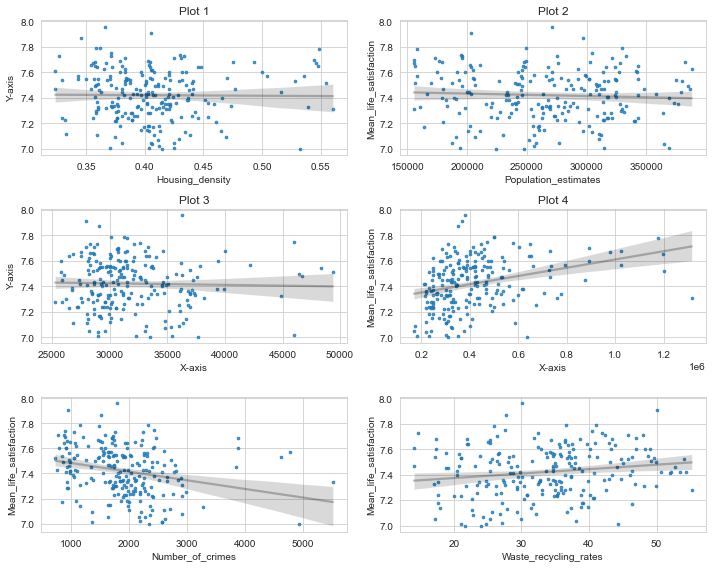

In [138]:
fig,axs = plt.subplots(3,2,figsize=(10,8))
features = ['Housing_density','Population_estimates','Median_annual_earning','Median_house_price','Number_of_crimes','Waste_recycling_rates']


sns.regplot(x=data[features[0]], y=data["Mean_life_satisfaction"], line_kws={'color': 'black', 'alpha': 0.25}, scatter_kws={'s':7}, ax=axs[0,0])
sns.regplot(x=data[features[1]], y=data["Mean_life_satisfaction"], line_kws={'color': 'black', 'alpha': 0.25}, scatter_kws={'s':7},ax=axs[0,1])
sns.regplot(x=data[features[2]], y=data["Mean_life_satisfaction"], line_kws={'color': 'black', 'alpha': 0.25}, scatter_kws={'s':7},ax=axs[1,0])
sns.regplot(x=data[features[3]], y=data["Mean_life_satisfaction"], line_kws={'color': 'black', 'alpha': 0.25}, scatter_kws={'s':7},ax=axs[1,1])
sns.regplot(x=data[features[4]], y=data["Mean_life_satisfaction"], line_kws={'color': 'black', 'alpha': 0.25}, scatter_kws={'s':7},ax=axs[2,0])
sns.regplot(x=data[features[5]], y=data["Mean_life_satisfaction"], line_kws={'color': 'black', 'alpha': 0.25}, scatter_kws={'s':7},ax=axs[2,1])

# set the titles and labels for each subplot
axs[0, 0].set_title('Plot 1')
axs[0, 1].set_title('Plot 2')
axs[1, 0].set_title('Plot 3')
axs[1, 1].set_title('Plot 4')
axs[1, 0].set_xlabel('X-axis')
axs[1, 1].set_xlabel('X-axis')
axs[0, 0].set_ylabel('Y-axis')
axs[1, 0].set_ylabel('Y-axis')

# adjust the spacing between subplots
plt.tight_layout()
#plt.show()

2.	How are demographics statistics correlated to personal-well being in London from 2011 to 2018?

In [140]:
corr['Mean_life_satisfaction']

Year                      0.553585
Number_of_crimes         -0.257947
Median_annual_earning    -0.026321
Mean_life_satisfaction    1.000000
Population_estimates     -0.057358
Waste_recycling_rates     0.164894
Median_house_price        0.317143
Housing_density          -0.010687
Name: Mean_life_satisfaction, dtype: float64

From the table above we can see that the year has a high correlation with the Mean life satisfaction. This can have severale reasons:
1. Economic trends: It's possible that changes in the economy over this period could have affected people's life satisfaction. For example, if there was a period of economic growth, people might have felt more satisfied with their lives. Conversely, if there was a recession or economic downturn, people might have felt less satisfied.

2. Social policies: Changes in social policies or government initiatives during this period could also have impacted people's well-being. For example, changes to healthcare, education, or housing policies could have improved or worsened people's life satisfaction.

3. Demographic shifts: Changes in the population of London during this period could have also affected life satisfaction. For example, if there was an influx of younger, more diverse people into the city, this could have had an impact on people's sense of community and belonging.

4. Natural events: Natural events or disasters that occurred during this period could have also impacted life satisfaction. For example, if there was a heatwave or severe weather event, this could have affected people's physical and mental health, which in turn could impact their overall life satisfaction.

Another high correlation can be seen in the median house price. This can be described by the following points:
 1. Ecoomic factors: This can be explained by the tie between economic factors such as employment opportunities and income levels. It's possible that as the median house price increased over this period, so did the overall economic well-being of London residents. If people felt financially secure, they may have reported higher levels of life satisfaction.
2. Social factors: The cost of housing can also be tied to social factors such as access to quality education, healthcare, and community resources. As the median house price increased, it's possible that access to these resources also improved, leading to higher levels of life satisfaction.
3. Lifestyle factors: The cost of housing in London can also be tied to lifestyle factors such as proximity to public transportation, cultural events, and green spaces. As the median house price increased, it's possible that London residents had greater access to these amenities, which could have led to higher levels of life satisfaction.


These are just a few possibiliteis and other factors could also be at play. More research needs to be done in this respect.


### 3.	Which algorithms predicts best personal well-being?

| Method            | R<sup>2</sup> Score | Mean Absolute Error |
|-------------------|------------------| -----------------------|
| Linear Regression | 0.304 | 0.131 |
| Polynomial Regression | 0.333| 0.130 |
| Random Forest     | 0.516| 0.115 |
| Neural Network    |  -16.028 | 0.657 |
| RandomizedSearch NN     | -2.390| 0.293|

From the results obtained, we can see that Random Forest outperforms all of our models by having an  R<sup>2 </sup>  score of 50%. This means that 50% of the variance in the personal well being of individuals, can be explained by the other variables/features. Now, from the results of the model, we can see that the 3 most important features are year, number of crimes and  median house price. The number of crimes per borough was expected to be an important feature because if in an area there are a lot of crimes, is obvious that people will be less happy. Now, the median house price is also in line with what we were expecting. Finally, as previously shown and discussed, we saw that the happiness of individuals in London increased significantly since 2011, which is due to the occurance of different events and it explains the fact of this feature being the most significnat one, as individual's happiness is highly corralated to events that occur in their live.

Now, regarding the poor performance of NN and randomiyed search NN, this could be due to the lack of available data and further research should be done.